# Assignment #8

This assignment can be completed by adding code to this notebook for each question.

Turn in a completed script, renamed as

`assignment8_<username>.py`

with your `<username>` being your DataVU login name (e.g., mine is `kgoebber`) to `/archive/courses/met330/assignment8` via the Linux computing system.

**DUE DATE: 18 November 2022 at 5 pm.**

Prior to turning in your script, please cleanup and comment your code for each problem. Be sure that your output is self-describing.

In [1]:
# add all imports needed to this cell
from datetime import datetime, timedelta

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import metpy.calc as mpcalc
from metpy.interpolate import interpolate_to_grid
from metpy.io import add_station_lat_lon
from metpy.plots import StationPlot
from metpy.units import units
import numpy as np
from siphon.catalog import TDSCatalog
import xarray as xr

## Question #1
(25 points) Create a gridded interpolation of MSLP for a given date and time with a five minute timedelta. Plot a region for the eastern CONUS (from Colorado to just off the Atlantic coast) including the contours of MSLP (every 4 hPa) from the gridded interpolation and the MSLP values to the tenths (e.g., 1004.3 hPa).

Data (5 points):
  * Use ASOS surface observations using given definition to read data using a 5 minute timedelta
  * Use altimeter values (`alti`) and convert to units of `hPa` from `inHg`

Grid Interpolation (10 points):
  * interpolation type: `'rbf'`
  * horizontal grid spacing: `0.25` degree lat/lon
  * smooth contour field

Plot Grid and Observations (10 points):
  * Region: west=-110 W; east=-60 W; south=25 N; north=50 N
  * Use a Lambert Conformal Projection with `central_longitude=-100` and `central_latitude=40`
  * Contours of MSLP (every 4 hPa) from gridded interpolation of surface observations
  * Plot values of MSLP in tenths (e.g., 1003.4 hPa)
  * Reduce plotted values with radius of 100 km (https://unidata.github.io/MetPy/latest/api/generated/metpy.calc.reduce_point_density.html)
  
Example Image:
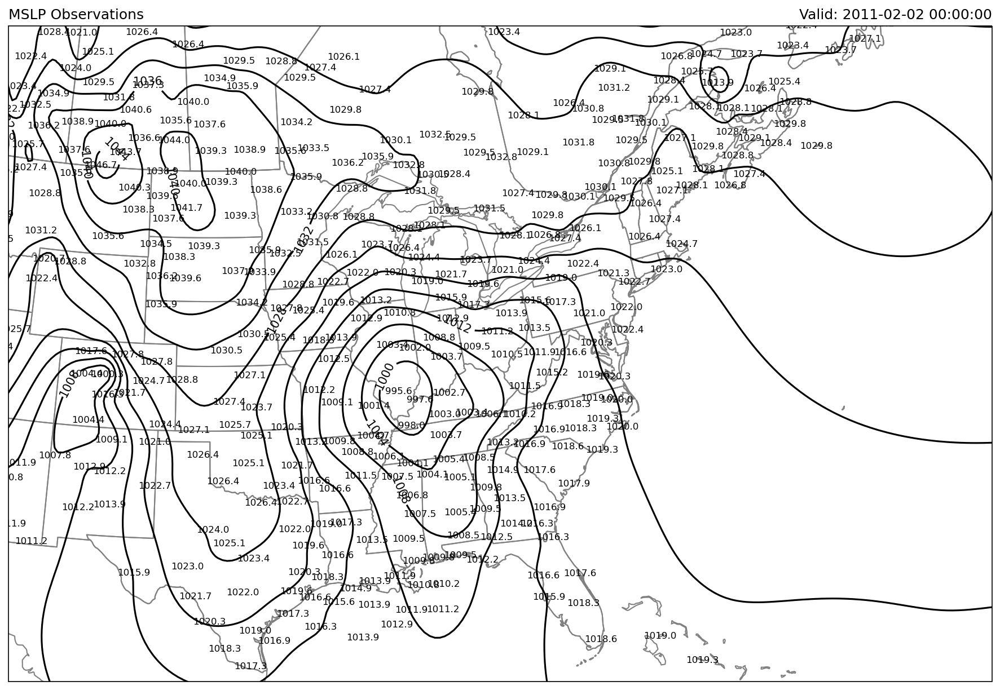

In [2]:
def read_remote_surface_data(date, dt=timedelta(minutes=20)):
    '''A function to read data from Iowa State ASOS archive.
    
    Input:
      - date: a datetime object
      - dt: a timedelta object indicating the timespan to collect data
    
    Output:
      - returns a Pandas DataFrame of the most recent surface observations from the given date, time, and timedelta range.
    '''
    import pandas as pd
    
    sdate = date - dt
    edate = date + dt

    df = pd.read_csv('http://mesonet.agron.iastate.edu/cgi-bin/request/asos.py?data=all&tz=Etc/UTC&format=comma&latlon=yes&'
                     f'year1={sdate.year}&month1={sdate.month}&day1={sdate.day}&hour1={sdate.hour}&minute1={sdate.minute}&'
                     f'year2={edate.year}&month2={edate.month}&day2={edate.day}&hour2={edate.hour}&minute2={edate.minute}',
                     skiprows=5, na_values=['M']).replace('T', 0.00001)
    return df.groupby('station').tail(1)

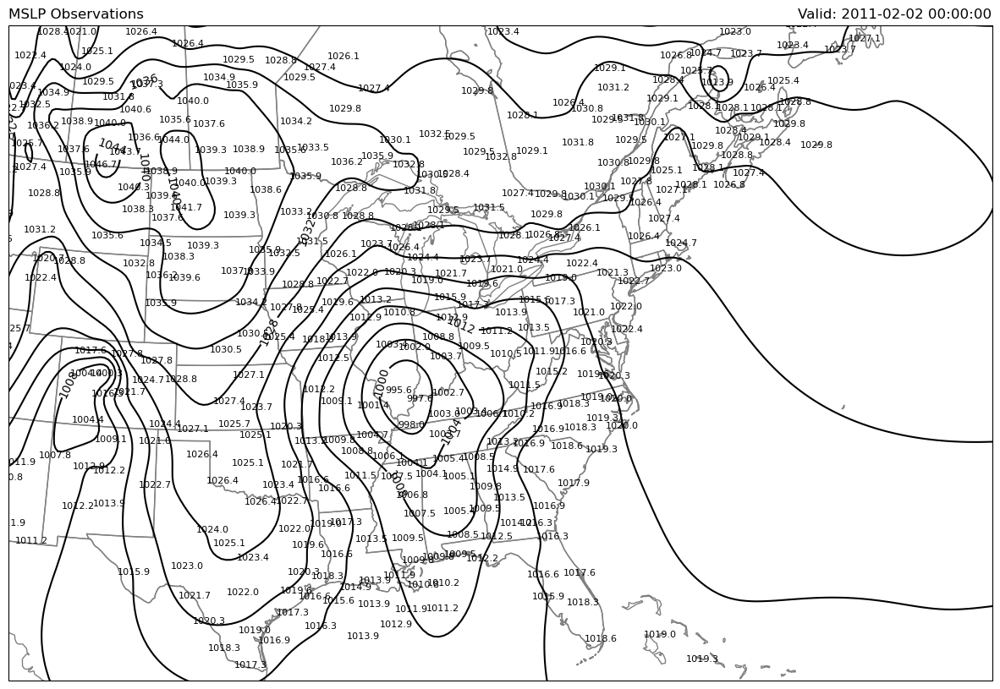

In [6]:
date = datetime(2011, 2, 2, 0)
df = read_remote_surface_data(date, timedelta(minutes=5))

df = df.dropna(subset='alti')
lat = df['lat']
lon = df['lon']

proj = ccrs.LambertConformal(central_longitude=-100, central_latitude=40)
point_locs = proj.transform_points(ccrs.PlateCarree(), lon, lat)
data = df[mpcalc.reduce_point_density(point_locs, 100 * units.km)]
#data = df
mslp = (data['alti'].values * units.inHg).to('hPa')

gridx, gridy, grid_mslp = interpolate_to_grid(data['lon'], data['lat'], mslp,
                                              interp_type='rbf', hres=0.25)
grid_mslp_smooth = mpcalc.smooth_n_point(grid_mslp, 9, 3)

plt.figure(1, figsize=(15, 13))
ax = plt.subplot(111, projection=proj)
ax.set_extent([-110, -60, 25, 50], ccrs.PlateCarree())

station = StationPlot(ax, data['lon'], data['lat'], fontsize=8,
                      transform=ccrs.PlateCarree(), clip_on=True)

station.plot_parameter('C', mslp, formatter='.1f')

cs = ax.contour(gridx, gridy, grid_mslp_smooth, np.arange(0, 2000, 4), colors='black', transform=ccrs.PlateCarree())
plt.clabel(cs)

# Add Geographic Features
ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='grey')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='grey')
ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='grey')

# Add titles
plt.title(f'MSLP Observations', loc='left')
plt.title(f'Valid: {date}', loc='right')

plt.savefig(f'MSLP_{date:%Y%m%d%H}.png', dpi=150, bbox_inches='tight')
plt.show()

## Question #2

(35 points) Construct an RGB Airmass product for GOES-16 for a chosen date and time (where the time should be one of 00, 06, 12, or 18 UTC) and compute and plot the GFS 303 K isentropic surface (pressure and wind components) over a CONUS domain as an overlay on the computed RGB Airmass image.

The RGB Airmass product is a combination of four different infrared bands. It is useful for identifying air masses, monitoring jet streams and jet streaks, cyclogenesis and potential vorticity maxima or anomalies.
 - The 'Red' channel is a difference of ABI bands 8 and 10
 - The 'Green' is a difference of bands 12 and 13
 - The 'Blue' is solely being represented by ABI band 8 (convert to Celsius from Kelvin).

Convert Channel to values between 0 and 1 with:
`channel = ((channel - min_val) / (max_val - min_val))**(1 / gamma)`

## Airmass RGB Recipe
Color | Band / Band Diff. (μm) | Min – Max | Gamma
-|-|-|-
Red | 6.2 – 7.3 | -26.2 to 0.6 C | 1
Green | 9.6 – 10.3 | -43.2 to 6.7 C | 1
Blue | 6.2 | -29.25 to -64.65 C | 1

Question Elements:
* Read required ABI bands 8, 10, 12, and 13 (5 points)
  - Use the function given below to read each channel and isolate the `Sectorized_CMI` variable
* Compute RGB Airmass imagery (10 points)
* Compute the GFS 303 K isentropic surface (5 points)
  - Use the following data access for recent GFS, which uses a datetime object stored as `date`
```python
  ds = xr.open_dataset('https://thredds.ucar.edu/thredds/dodsC/grib/NCEP/GFS/'
                      f'Global_0p5deg/GFS_Global_0p5deg_{date:%Y%m%d_%H}00.grib2')
```
* Plot the RGB Airmass imagery (5 points)
* Plot the 300 K isentropic pressure and wind barbs as an overlay (10 points)

Example Image:
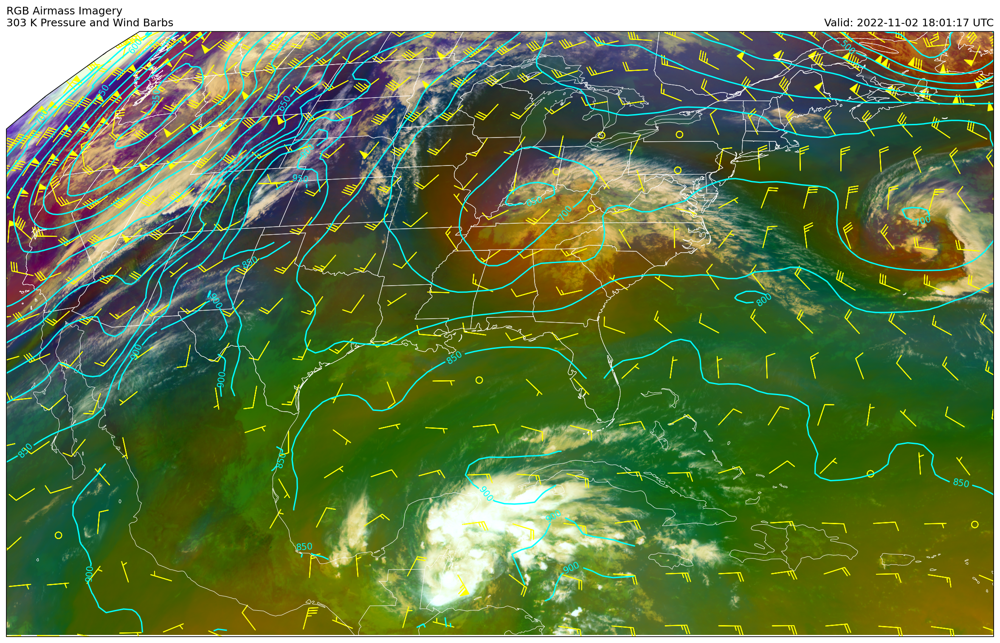


Color | Band / Band Diff. (μm) | Min – Max | Gamma
-|-|-|-
Red | 6.2 – 7.3 | -26.2 to 0.6 C | 1
Green | 9.6 – 10.3 | -43.2 to 6.7 C | 1
Blue | 6.2 (inverted) | -29.25 to -64.65 C | 1

In [7]:
def get_satellite_data(date, region='CONUS', channel=2, satellite='east'):
    '''
    This function helps to obtain GOES satellite data by channel from the UCAR THREDDS server.
    
    Input:
      * date - a datetime object specifying the desired time
      * region - the portion of satellite data wanted
        - CONUS (default)
        - fulldisk
      * channel (int value 1 - 16; default is 2)
      * satellite ('east' or 'west'; default is 'east')
    
    Output:
      * xarray DataArray containing the nearest time requested satellite data for the region, channel, and satellite.
    '''
    # We want to match something like:
    # https://thredds-test.unidata.ucar.edu/thredds/catalog/satellite/goes16/GOES16/Mesoscale-1/Channel08/20181113/catalog.html

    # Construct the data_url string
    data_url = (f'https://thredds.ucar.edu/thredds/catalog/satellite/goes/{satellite}/products/'
                f'CloudAndMoistureImagery/{region}/Channel{channel:02d}/'
                f'{date:%Y%m%d}/catalog.xml')

    # Get list of files available for particular day
    cat = TDSCatalog(data_url)

    # Grab dataset for desired time
    dataset = cat.datasets.filter_time_nearest(date, regex=r'_s(?P<strptime>\d{13})', strptime='%Y%j%H%M%S')

    # Open most recent file available
    ds = dataset.remote_access(use_xarray=True).metpy.parse_cf()
    
    return ds

In [10]:
date = datetime(2022, 12, 22, 18)

ch8 = get_satellite_data(date, channel=8).Sectorized_CMI
ch10 = get_satellite_data(date, channel=10).Sectorized_CMI
ch12 = get_satellite_data(date, channel=12).Sectorized_CMI
ch13 = get_satellite_data(date, channel=13).Sectorized_CMI

In [11]:
gamma = 1

red = ch8.values - ch10.values
rmin = -26.2
rmax = 0.6
red = ((red - rmin) / (rmax - rmin))**(1 / gamma)

green = ch12.values - ch13.values
gmin = -43.2
gmax = 6.7
green = ((green - gmin) / (gmax - gmin))**(1 / gamma)

bmin = -29.25
bmax = -64.65
blue = (ch8.values - 273.15)
blue = ((blue - bmin) / (bmax - bmin))**(1 / gamma)

# The RGB array for the image
RGB = np.dstack([red, green, blue])

In [12]:
ds_gfs = xr.open_dataset('https://thredds.ucar.edu/thredds/dodsC/grib/NCEP/GFS/'
                         f'Global_0p5deg/GFS_Global_0p5deg_{date:%Y%m%d_%H}00.grib2')

# Subset dataset for only certain variables
# Temperature, RH, u and v wind components
ds_subset = ds_gfs[['Temperature_isobaric', 'u-component_of_wind_isobaric', 'v-component_of_wind_isobaric']]
subset = dict(lat=slice(60, 15), lon=slice(360-140, 360-50),
              time=date, vertical=slice(100, None))

tmpk = ds_subset.Temperature_isobaric.metpy.sel(subset)
uwnd = ds_subset['u-component_of_wind_isobaric'].metpy.sel(subset)
vwnd = ds_subset['v-component_of_wind_isobaric'].metpy.sel(subset)

# define isentropic levels desired
levs = np.arange(285, 326, 3) * units.K
isent = mpcalc.isentropic_interpolation_as_dataset(levs, tmpk, uwnd, vwnd)

# Set desired level and subset data accordingly; smooth some fields
level = 303 * units.K
isent_pres = mpcalc.smooth_n_point(isent.pressure.sel(isentropic_level=level), 9, 2)
isent_uwnd = isent['u-component_of_wind_isobaric'].sel(lat=slice(None, None, 5),
                                                       lon=slice(None, None, 5),
                                                       isentropic_level=level).metpy.convert_units('kt')
isent_vwnd = isent['v-component_of_wind_isobaric'].sel(lat=slice(None, None, 5),
                                                       lon=slice(None, None, 5),
                                                       isentropic_level=level).metpy.convert_units('kt')

/Users/kgoebber/miniconda3/envs/main/lib/python3.10/site-packages/metpy/interpolate/one_dimension.py:152: UserWarning: Interpolation point out of data bounds encountered
  warnings.warn('Interpolation point out of data bounds encountered')
/Users/kgoebber/miniconda3/envs/main/lib/python3.10/site-packages/metpy/interpolate/one_dimension.py:162: RuntimeWarning: divide by zero encountered in divide
  var_interp = var[below] + (var[above] - var[below]) * ((x_array - xp[below])


2022-12-22 18:01:17


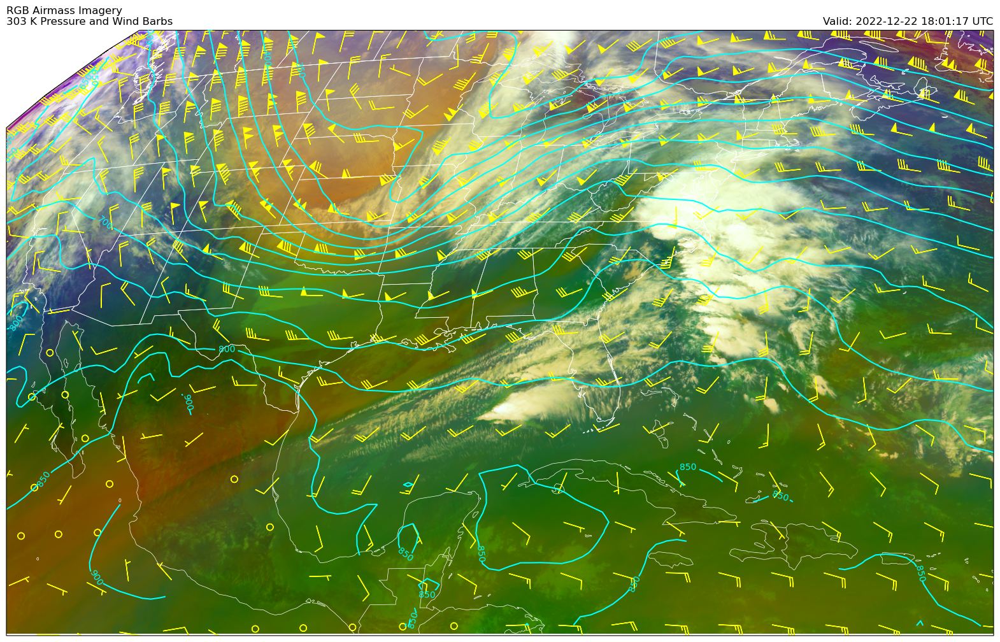

In [13]:
# specify the valid time from the file
vtime = ch8.time.values.astype('datetime64[ms]').astype('O')
print(vtime)

# Pull projection from DataArray
proj = ch8.metpy.cartopy_crs

# We also need the x (north/south) and y (east/west) axis sweep of the ABI data
x = ch8.x
y = ch8.y

# RGB Airmass Image
plt.figure(1, figsize=(20, 20))
ax = plt.subplot(111, projection=proj)
ax.set_extent([-112, -62, 15, 51], ccrs.PlateCarree())

ax.imshow(RGB, vmin=0, vmax=1, origin='upper',
          extent=(x.min(), x.max(), y.min(), y.max()),
          transform=proj)

# Contour Pressure in black
cs = ax.contour(isent.lon, isent.lat, isent_pres, np.arange(0, 1000, 50),
                colors='cyan', transform=ccrs.PlateCarree())
plt.clabel(cs)

# Add wind barbs in knots
ax.barbs(isent_uwnd.lon, isent_uwnd.lat,
         isent_uwnd.data, isent_vwnd.data,
         color='yellow', transform=ccrs.PlateCarree())

ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='white', lw=0.5)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='white', lw=0.5)
ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='white', lw=0.5)

plt.title(f'RGB Airmass Imagery\n{level.m} K Pressure and Wind Barbs', loc='left')
plt.title(f'Valid: {vtime} UTC', loc='right')

plt.savefig(f'RGB_Airmass_{level.m}K_surface.png', dpi=150, bbox_inches='tight')
plt.show()